<a href="https://colab.research.google.com/github/rabialtafkhan/SfM-Interactive-Virtual-Tour/blob/main/Group7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **3D Scene Reconstruction and Virtual Tour**
## Group 7:
### Member 1 (self-appointed leader): **27100418**
### Member 2: **27100376**  

## **Phase 0: Data Collection + Preprocessing**

In [1]:
import os
from PIL import Image
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/436_dataset'
images = []
image_paths = []
count = 0
for filename in sorted(os.listdir(path)):
    if filename.endswith('.jpg'):
        count = count + 1
        img_path = os.path.join(path, filename)
        img = Image.open(img_path)
        images.append(img)
        image_paths.append(img_path)
print("number of images loaded: ", count)
print("size of single image:", images[0].size)

Mounted at /content/drive
number of images loaded:  17
size of single image: (738, 1600)


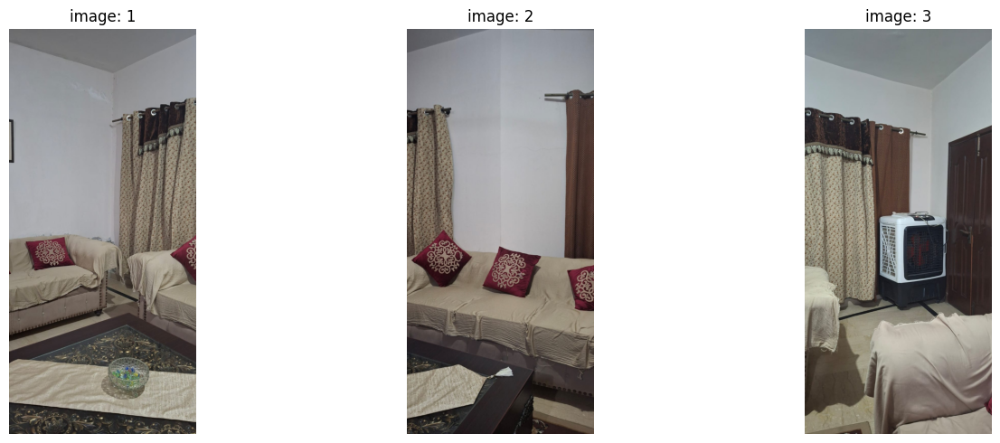

In [2]:
# display imgs:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, min(3, len(images)), figsize=(15, 5))
for i, img in enumerate(images[:3]):
    axes[i].imshow(img)
    axes[i].set_title(f"image: {i+1}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()

## **Phase 1: The Two-View Foundation**



In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import glob

In [21]:
# function that takes in two images -> valid sparse 3D point cloud + saves it as .ply file
def two_view_foundation(path_1, path_2, output_filename='point_cloud.ply'):
  img1 = Image.open(path_1)
  img2 = Image.open(path_2)
  w, h = 1600, 738
  fx = fy = w
  cx, cy = w/2, h/2

  K_1 = np.array([[fx,  0, cx],
                [ 0, fy, cy],
                [ 0,  0,  1]])
  img1_cv = cv2.cvtColor(np.array(img1), cv2.COLOR_RGB2BGR)
  img2_cv = cv2.cvtColor(np.array(img2), cv2.COLOR_RGB2BGR)
  sift = cv2.SIFT_create()
  kp_1, des_1 = sift.detectAndCompute(img1_cv, None)
  kp_2, des_2 = sift.detectAndCompute(img2_cv, None)
  # FLANN
  index_params = dict(algorithm=1, trees=5)
  search_params = dict(checks=50) # how many times tree is traversed
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des_1, des_2, k=2) # k=2 for lowe's ratio test
  good_matches = []
  for m, n in matches:
      if m.distance < 0.7 * n.distance:  # 0.7 is the ratio threshold
          good_matches.append(m)
  if len(good_matches) < 8:
        print(f"⚠️ not enough matches: {len(good_matches)}")
        return None
  points_img1 = np.float32([kp_1[m.queryIdx].pt for m in good_matches])
  points_img2 = np.float32([kp_2[m.trainIdx].pt for m in good_matches])
  # apparently the intrinsic matrices are the same for both imgs bc same camera
  E, inlier_mask = cv2.findEssentialMat(
      points_img1,
      points_img2,
      K_1, # just using 1 for no reason could also be second img's
      method=cv2.RANSAC, # following instructions
      prob=0.999, # v. confidence level
      threshold=1.0  # max reprojection error (in pixels)
  )
  if E is None or E.shape != (3, 3):
        print("⚠️ Failed to compute Essential matrix")
        return None
  num_inliers = np.sum(inlier_mask)
  # decompose E to find 4 relevant camera poses => cv2.recoverPose
  num_inliers, R, t, pose_mask = cv2.recoverPose(
      E,
      points_img1,
      points_img2,
      K_1,
      mask=inlier_mask
  )
  points_img1 = points_img1.reshape(-1, 2)
  points_img2 = points_img2.reshape(-1, 2)
  # triangulate matched 2D points into 3D space for 4 possible poses
  P1 = K_1 @ np.hstack([np.eye(3), np.zeros((3, 1))]) # [I|0]
  P2 = K_1 @ np.hstack([R, t]) # [R|t]
  points_4d = cv2.triangulatePoints(P1, P2, points_img1.T, points_img2.T)
  points_3d = (points_4d[:3] / points_4d[3]).T # homogenous -> 3D
  # perform cheirality test to disambiguiate pose -> find single [R|T] matrix with majority 3D points in front of both cameras
  # done by cv2.recoverPose() alr
  valid = pose_mask.ravel() == 1
  points_3d = points_3d[valid]
  match_img = cv2.drawMatches(img1_cv, kp_1, img2_cv, kp_2, good_matches[:100], None,
                                 flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  plt.figure(figsize=(20, 10))
  plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
  plt.title(f'Feature Matches: {len(good_matches)} good matches')
  plt.axis('off')
  plt.show()
  with open(output_filename, 'w') as f:
        f.write("ply\nformat ascii 1.0\n")
        f.write(f"element vertex {len(points_3d)}\n")
        f.write("property float x\nproperty float y\nproperty float z\n")
        f.write("end_header\n")
        for p in points_3d:
            f.write(f"{p[0]} {p[1]} {p[2]}\n")
  return points_3d

pair:  1 out of  16


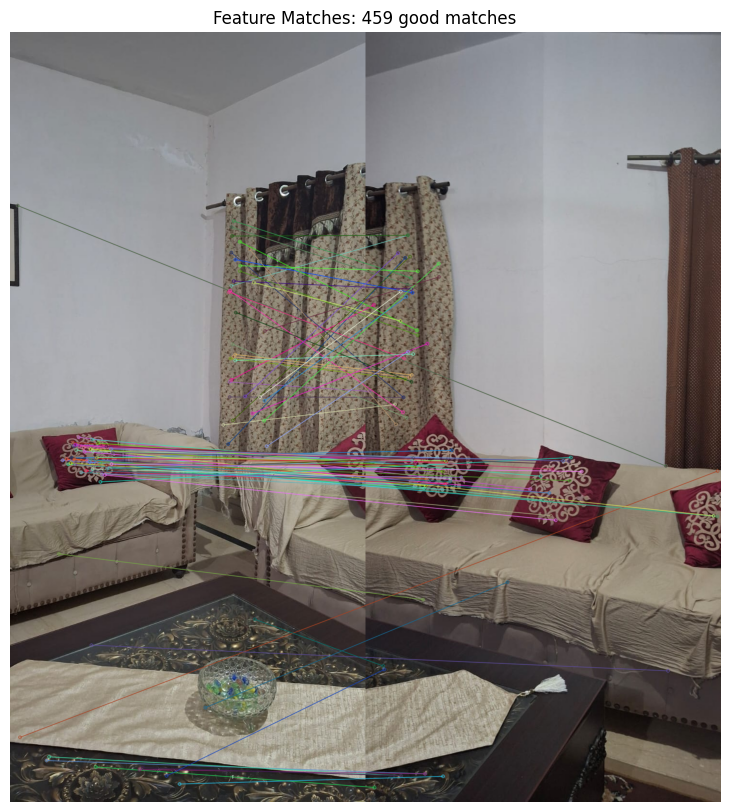

pair:  2 out of  16


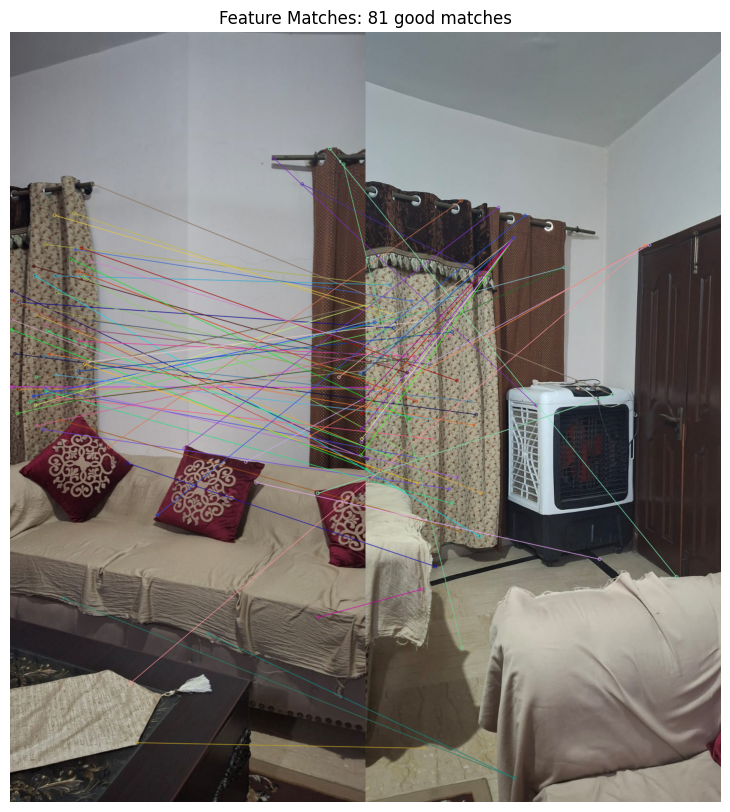

pair:  3 out of  16


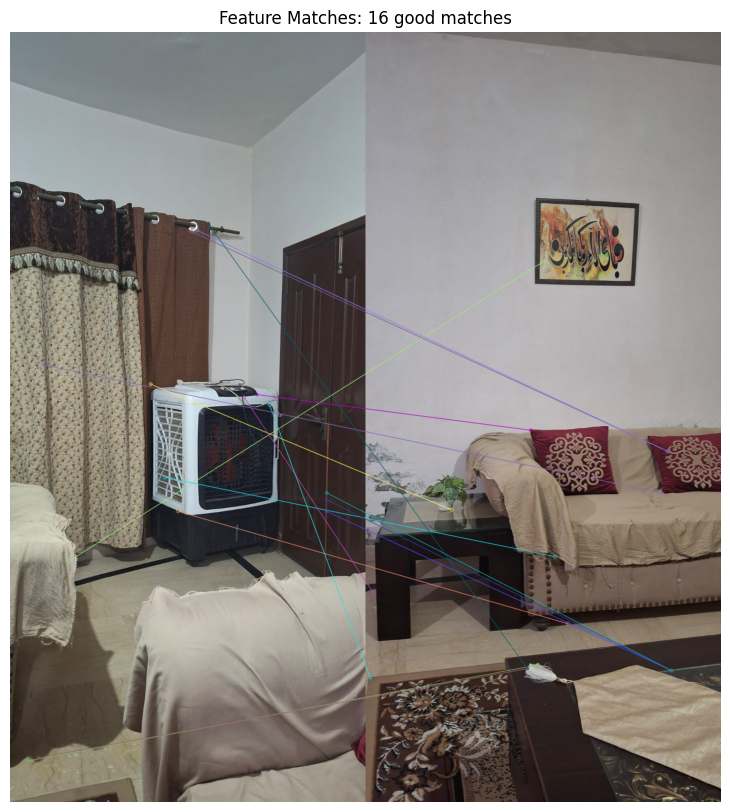

pair:  4 out of  16


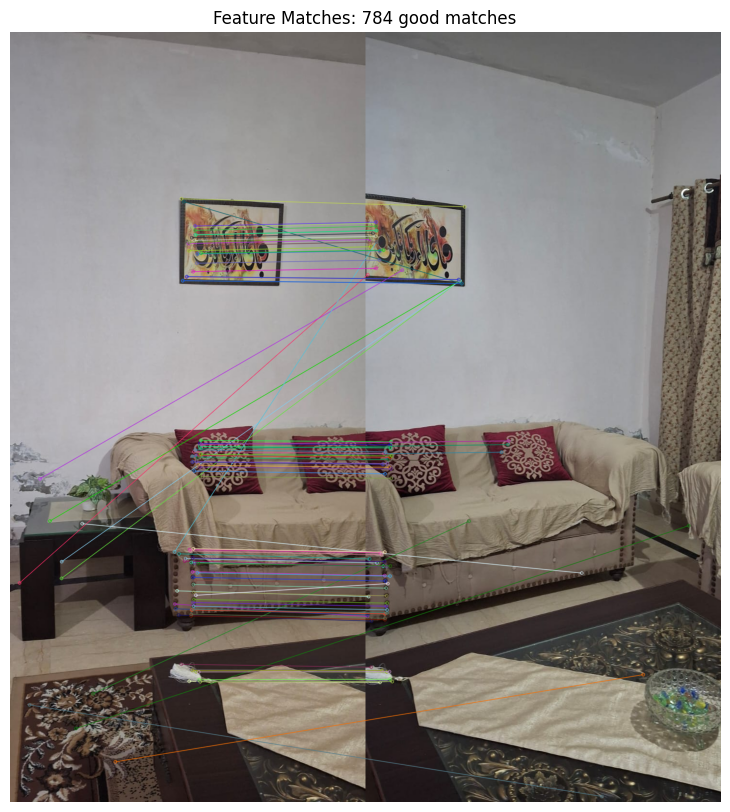

pair:  5 out of  16


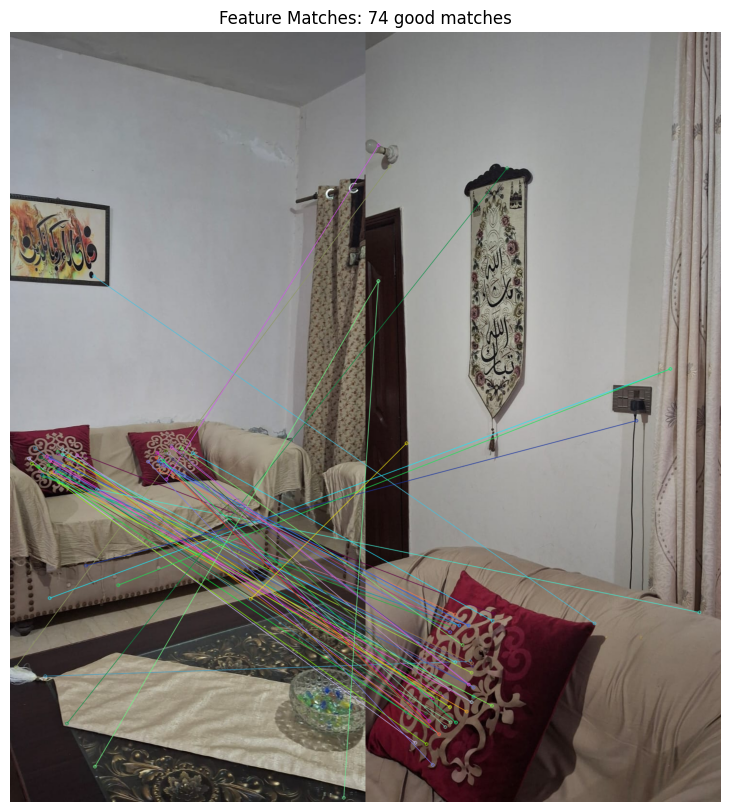

pair:  6 out of  16


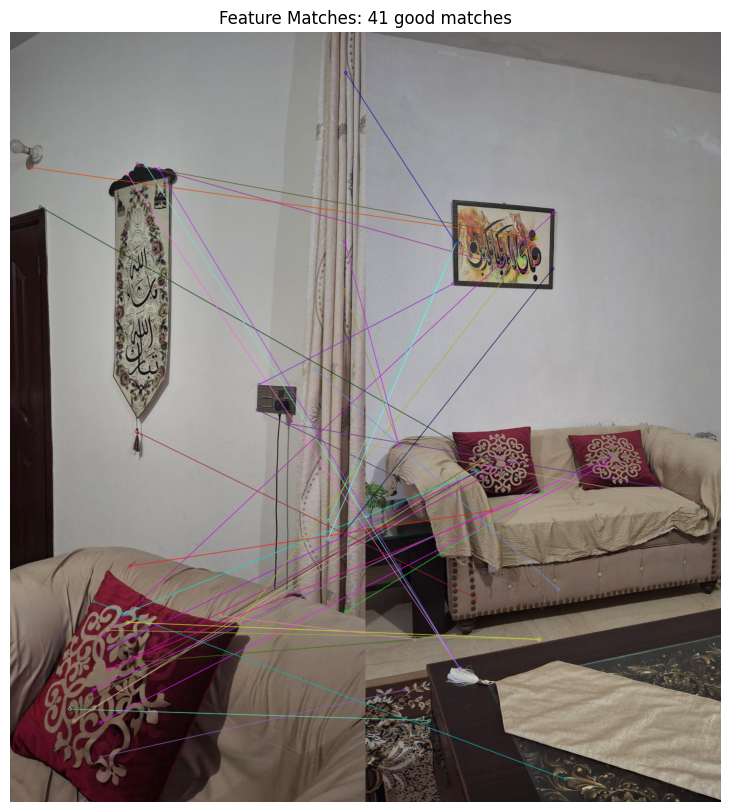

pair:  7 out of  16


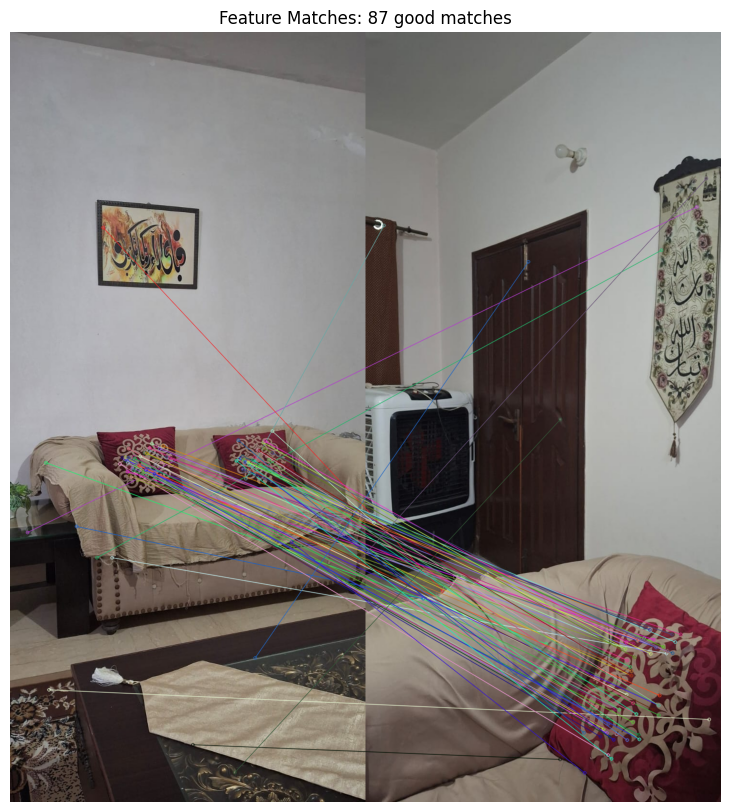

pair:  8 out of  16


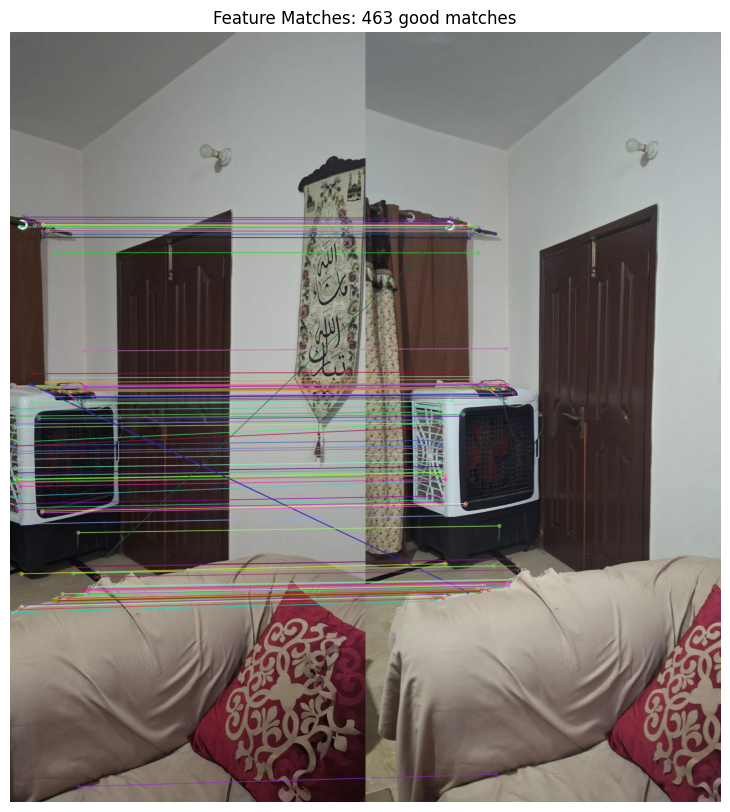

pair:  9 out of  16


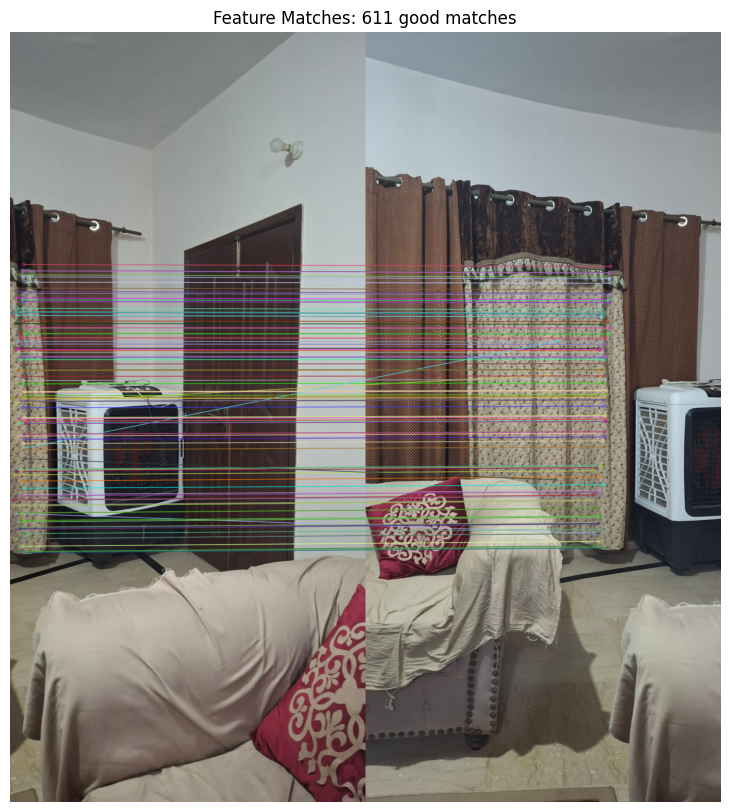

pair:  10 out of  16


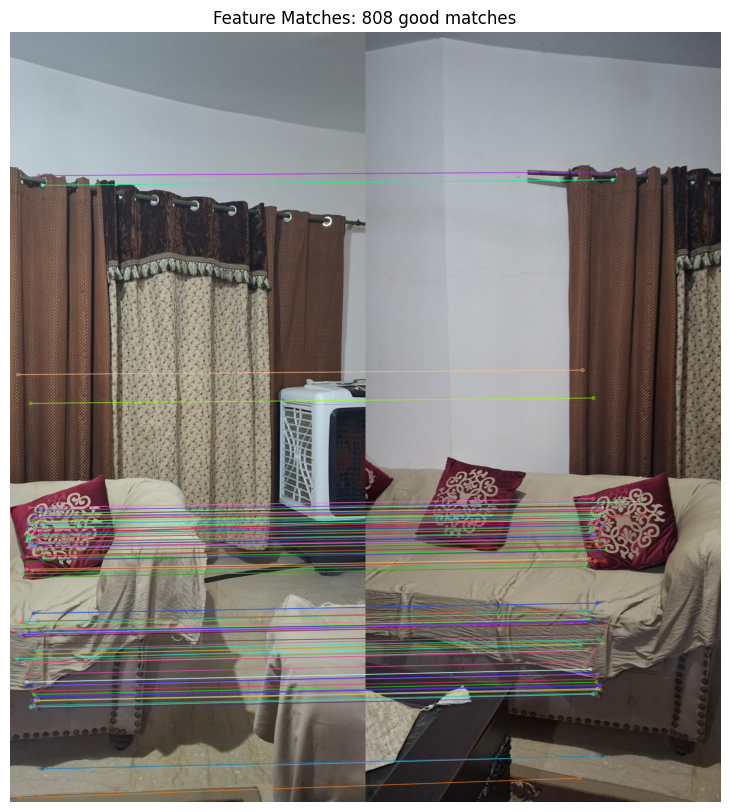

pair:  11 out of  16


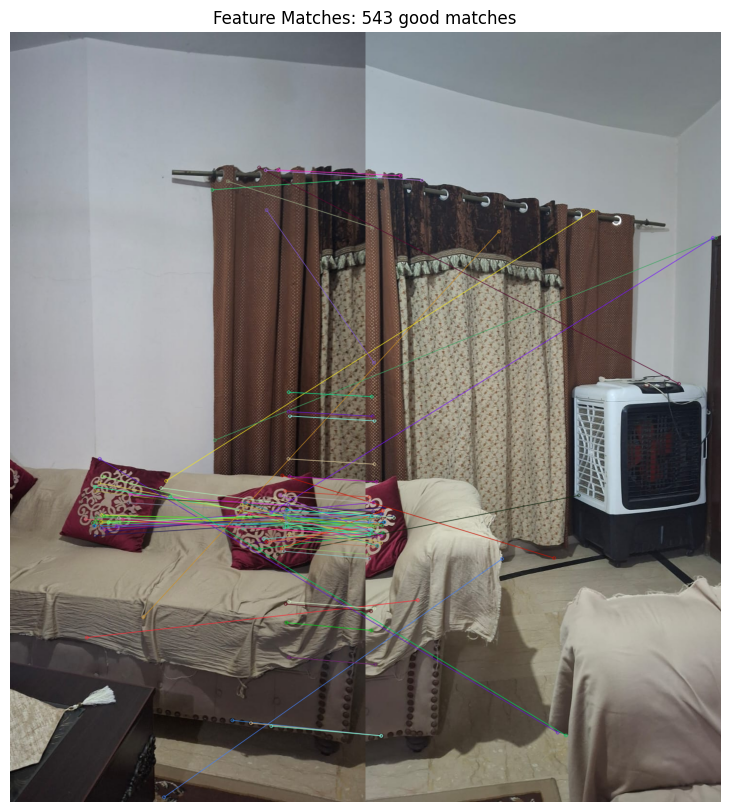

pair:  12 out of  16


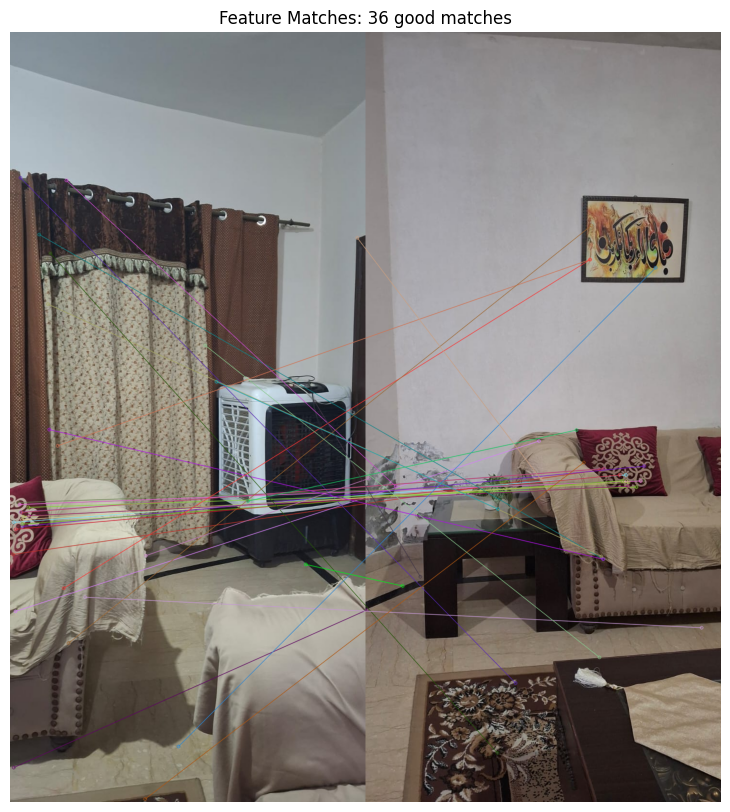

pair:  13 out of  16


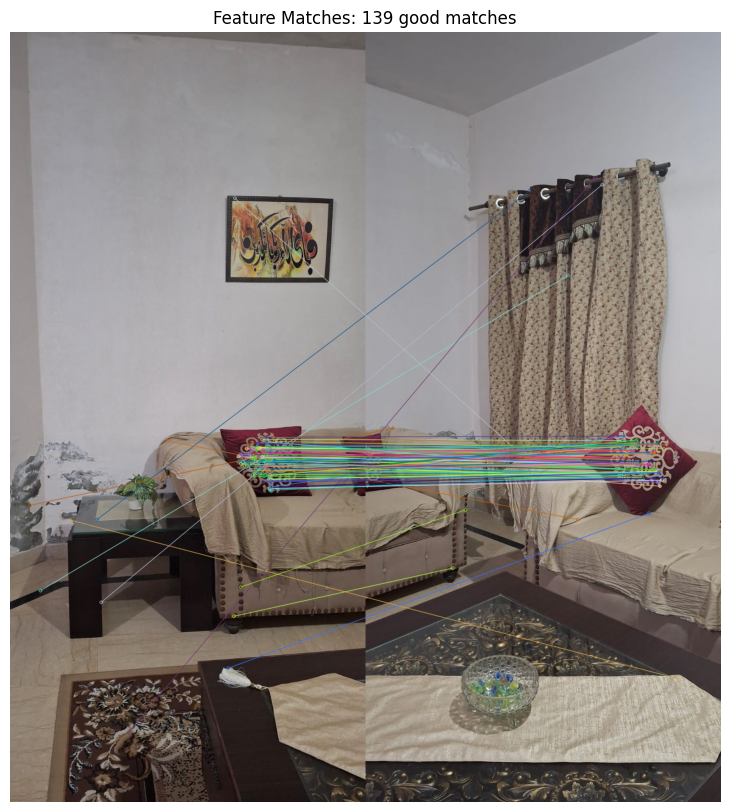

pair:  14 out of  16


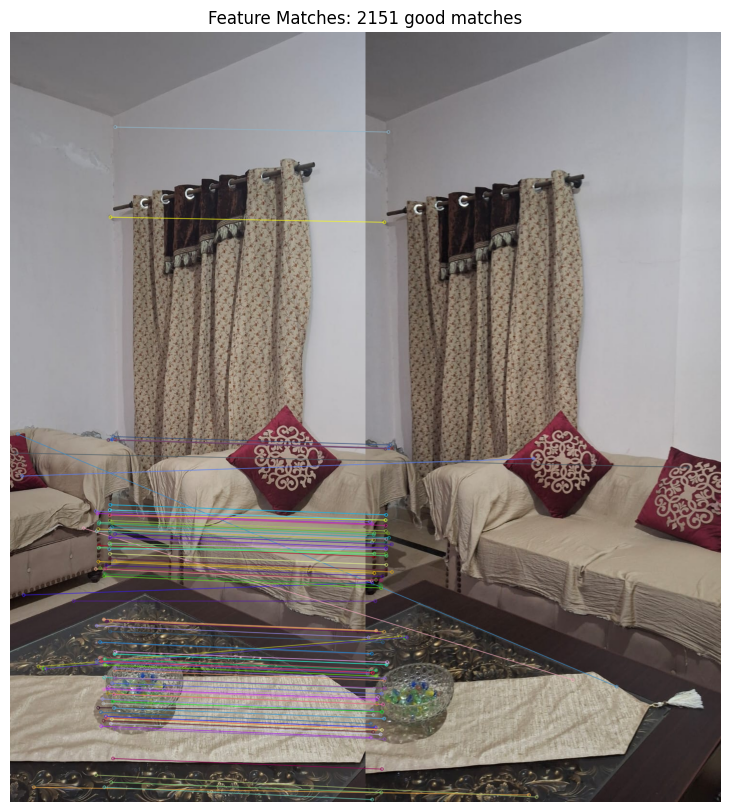

pair:  15 out of  16


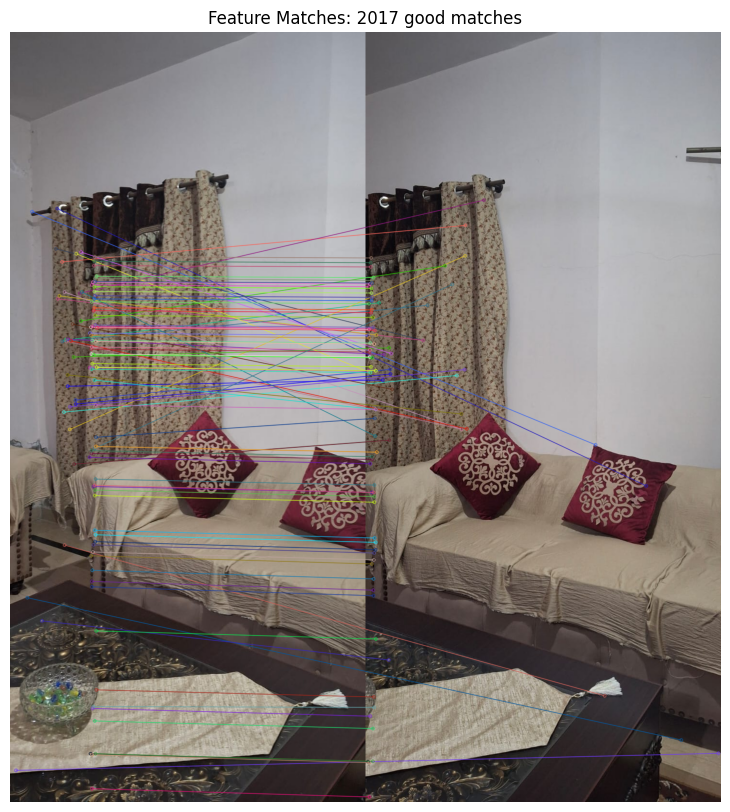

pair:  16 out of  16


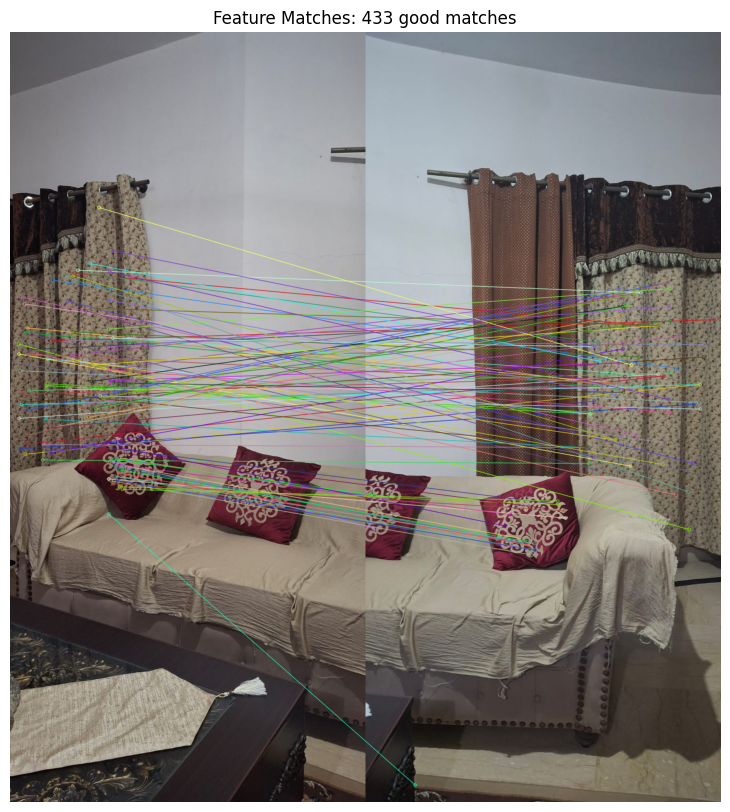

In [7]:
output_folder = '/content/drive/MyDrive/436_dataset/point_clouds'
os.makedirs(output_folder, exist_ok=True)
image_paths = sorted(glob.glob(os.path.join(path, '*.*')))
point_clouds = []
for i in range(len(image_paths) - 1):
    print("pair: ", i+1, "out of ", len(image_paths)-1)
    output_file = os.path.join(output_folder, f'reconstruction_{i}_{i+1}.ply')
    points = two_view_foundation(image_paths[i], image_paths[i+1], output_file)
    point_clouds.append(points)

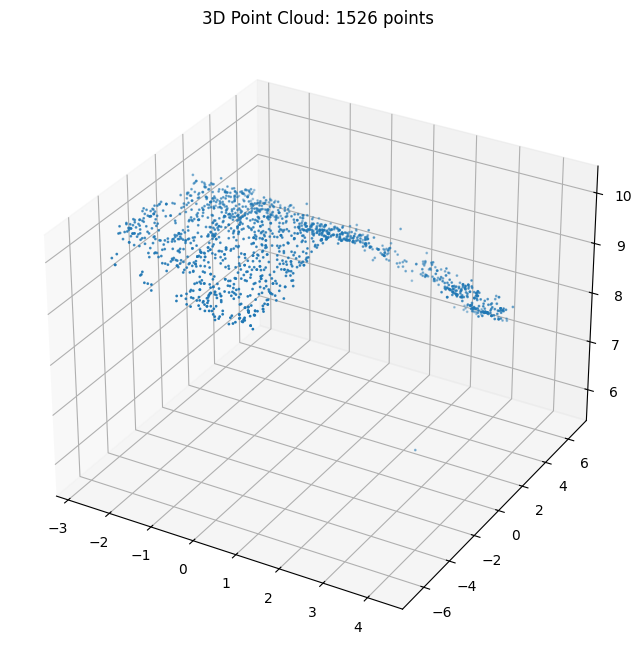

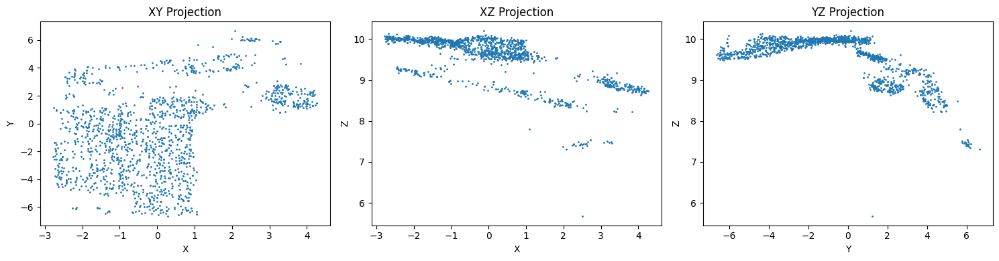

In [9]:
import glob
ply_files = sorted(glob.glob('/content/drive/MyDrive/436_dataset/point_clouds/*.ply'))
for ply_file in ply_files:
    if 'reconstruction_14_15' in ply_file:
        points = []
        with open(ply_file, 'r') as f:
            in_data = False
            for line in f:
                if line.startswith('end_header'):
                    in_data = True
                    continue
                if in_data:
                    x, y, z = map(float, line.strip().split())
                    points.append([x, y, z])

        points = np.array(points)

        # 3D visualization
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=1)
        ax.set_title(f'3D Point Cloud: {len(points)} points')
        plt.show()

        # 2D scatter plots
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        axes[0].scatter(points[:, 0], points[:, 1], s=1)
        axes[0].set_xlabel('X')
        axes[0].set_ylabel('Y')
        axes[0].set_title('XY Projection')

        axes[1].scatter(points[:, 0], points[:, 2], s=1)
        axes[1].set_xlabel('X')
        axes[1].set_ylabel('Z')
        axes[1].set_title('XZ Projection')

        axes[2].scatter(points[:, 1], points[:, 2], s=1)
        axes[2].set_xlabel('Y')
        axes[2].set_ylabel('Z')
        axes[2].set_title('YZ Projection')

        plt.tight_layout()
        plt.show()
        break

## **Phase 2: Incremental SfM and Refinement**



In [18]:
def multiview_sfm(image_paths, K, output_folder='/content/drive/MyDrive/436_dataset/point_clouds'):
    os.makedirs(output_folder, exist_ok=True)
    if K is None:
        w, h = Image.open(image_paths[0]).size
        K = np.array([[w, 0, w/2],
                      [0, w, h/2],
                      [0, 0, 1]], dtype=np.float64)

    sift = cv2.SIFT_create()
    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))

    init_ply = os.path.join(output_folder, 'init_0_1.ply')
    pts3d_init = two_view_foundation(image_paths[0], image_paths[1], output_filename=init_ply)
    if pts3d_init is None or len(pts3d_init) == 0:
        raise RuntimeError("two_view_foundation failed to initialize. Check matches / images.")

    img1_cv = cv2.cvtColor(np.array(Image.open(image_paths[0])), cv2.COLOR_RGB2BGR)
    img2_cv = cv2.cvtColor(np.array(Image.open(image_paths[1])), cv2.COLOR_RGB2BGR)
    kp1, des1 = sift.detectAndCompute(img1_cv, None)
    kp2, des2 = sift.detectAndCompute(img2_cv, None)

    matches12 = flann.knnMatch(des1, des2, k=2)
    good12 = [m for m, n in matches12 if m.distance < 0.7 * n.distance]
    if len(good12) < 8:
        raise RuntimeError(f"Not enough good matches in first pair: {len(good12)}")

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good12])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good12])
    E, maskE = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, prob=0.999, threshold=1.0)
    if E is None:
        raise RuntimeError("Essential matrix failed on first pair after matching.")
    _, R12, t12, mask_pose = cv2.recoverPose(E, pts1, pts2, K, mask=maskE)

    inlier_idx = (maskE.ravel() == 1)
    pts1_in = pts1[inlier_idx]
    pts2_in = pts2[inlier_idx]
    P1 = K @ np.hstack([np.eye(3), np.zeros((3,1))])
    P2 = K @ np.hstack([R12, t12])
    pts4d = cv2.triangulatePoints(P1, P2, pts1_in.T, pts2_in.T)
    pts3d_reproj = (pts4d[:3] / pts4d[3]).T
    map_points = [p for p in pts3d_reproj]

    kp2map_img0 = [-1] * len(kp1)
    kp2map_img1 = [-1] * len(kp2)
    map_idx = 0
    for j, m in enumerate(good12):
        if inlier_idx[j]:
            qidx = m.queryIdx
            tidx = m.trainIdx
            kp2map_img0[qidx] = map_idx
            kp2map_img1[tidx] = map_idx
            map_idx += 1
    camera_poses = []
    camera_poses.append((np.eye(3), np.zeros((3,1))))
    camera_poses.append((R12, t12))

    prev_kp_list = [kp1, kp2]
    prev_des_list = [des1, des2]
    prev_kp2map = [kp2map_img0, kp2map_img1]
    init_save = os.path.join(output_folder, "reconstruction_0_1.ply")
    with open(init_save, 'w') as f:
        f.write("ply\nformat ascii 1.0\n")
        f.write(f"element vertex {len(map_points)}\n")
        f.write("property float x\nproperty float y\nproperty float z\n")
        f.write("end_header\n")
        for p in map_points:
            f.write(f"{p[0]} {p[1]} {p[2]}\n")
    for i in range(2, len(image_paths)):
        print(f"[multiview] processing image {i}/{len(image_paths)-1}: {image_paths[i]}")
        img_new_cv = cv2.cvtColor(np.array(Image.open(image_paths[i])), cv2.COLOR_RGB2BGR)
        kp_new, des_new = sift.detectAndCompute(img_new_cv, None)
        matches = flann.knnMatch(prev_des_list[-1], des_new, k=2)
        good_matches = [m for m, n in matches if m.distance < 0.7 * n.distance]
        obj_pts = []
        img_pts = []
        corresponding_prev_kp_idx = []
        corresponding_new_kp_idx = []

        prev_kp_map = prev_kp2map[-1]
        for m in good_matches:
            prev_kp_idx = m.queryIdx
            new_kp_idx = m.trainIdx
            map_index = prev_kp_map[prev_kp_idx]
            if map_index != -1:
                obj_pts.append(map_points[map_index])
                img_pts.append(kp_new[new_kp_idx].pt)
                corresponding_prev_kp_idx.append(prev_kp_idx)
                corresponding_new_kp_idx.append(new_kp_idx)

        if len(obj_pts) < 6:
            print(f"  ⚠️ Not enough 2D-3D correspondences for PnP (found {len(obj_pts)}). Appending but skipping pose.")
            prev_kp_list.append(kp_new)
            prev_des_list.append(des_new)
            prev_kp2map.append([-1]*len(kp_new))
            continue

        obj_pts = np.array(obj_pts, dtype=np.float32)
        img_pts = np.array(img_pts, dtype=np.float32)

        success, rvec, tvec, inliers = cv2.solvePnPRansac(obj_pts, img_pts, K, None,
                                                          flags=cv2.SOLVEPNP_ITERATIVE,
                                                          reprojectionError=8.0,
                                                          iterationsCount=100)
        if not success or inliers is None or len(inliers) < 6:
            print(f"  ⚠️ solvePnPRansac failed or too few inliers ({0 if inliers is None else len(inliers)}).")
            prev_kp_list.append(kp_new)
            prev_des_list.append(des_new)
            prev_kp2map.append([-1]*len(kp_new))
            continue

        R_new, _ = cv2.Rodrigues(rvec)
        t_new = tvec.reshape(3,1)
        camera_poses.append((R_new, t_new))

        tri_prev_pts = []
        tri_new_pts = []
        tri_prev_idx_pairs = []
        for m in good_matches:
            prev_kp_idx = m.queryIdx
            new_kp_idx = m.trainIdx
            if prev_kp2map[-1][prev_kp_idx] == -1:
                tri_prev_pts.append(prev_kp_list[-1][prev_kp_idx].pt)
                tri_new_pts.append(kp_new[new_kp_idx].pt)
                tri_prev_idx_pairs.append((prev_kp_idx, new_kp_idx))

        if len(tri_prev_pts) >= 6:
            P_prev = K @ np.hstack([camera_poses[-2][0], camera_poses[-2][1]])
            P_new  = K @ np.hstack([R_new, t_new])
            pts_prev = np.float32(tri_prev_pts)
            pts_new  = np.float32(tri_new_pts)
            pts4d = cv2.triangulatePoints(P_prev, P_new, pts_prev.T, pts_new.T)
            pts3d_new = (pts4d[:3] / pts4d[3]).T

            new_map_indices_for_new = [-1] * len(kp_new)
            for j, p3 in enumerate(pts3d_new):
                mp_idx = len(map_points)
                map_points.append(p3)
                prev_idx, new_idx = tri_prev_idx_pairs[j]
                prev_kp2map[-1][prev_idx] = mp_idx
                new_map_indices_for_new[new_idx] = mp_idx
        else:
            new_map_indices_for_new = [-1] * len(kp_new)

        kp2map_new = [-1] * len(kp_new)
        for k_i, mp_i in enumerate(new_map_indices_for_new):
            if mp_i != -1:
                kp2map_new[k_i] = mp_i
        for m in good_matches:
            prev_kp_idx = m.queryIdx
            new_kp_idx = m.trainIdx
            mp_idx = prev_kp2map[-1][prev_kp_idx]
            if mp_idx != -1:
                kp2map_new[new_kp_idx] = mp_idx

        out_fn = os.path.join(output_folder, f'reconstruction_0_{i}.ply')
        with open(out_fn, 'w') as f:
            f.write("ply\nformat ascii 1.0\n")
            f.write(f"element vertex {len(map_points)}\n")
            f.write("property float x\nproperty float y\nproperty float z\n")
            f.write("end_header\n")
            for p in map_points:
                f.write(f"{float(p[0])} {float(p[1])} {float(p[2])}\n")

        prev_kp_list.append(kp_new)
        prev_des_list.append(des_new)
        prev_kp2map.append(kp2map_new)
    map_points_np = np.array(map_points, dtype=np.float32)
    return map_points_np, camera_poses


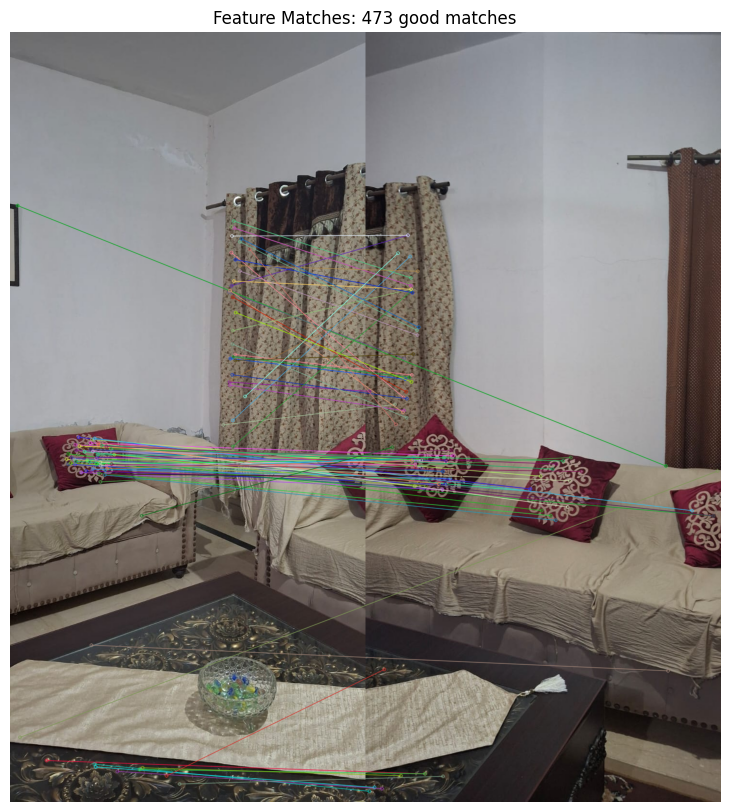

[multiview] processing image 2/16: /content/drive/MyDrive/436_dataset/IMG-20251201-WA0006.jpg
  ⚠️ solvePnPRansac failed or too few inliers (0).
[multiview] processing image 3/16: /content/drive/MyDrive/436_dataset/IMG-20251201-WA0007.jpg
  ⚠️ Not enough 2D-3D correspondences for PnP (found 0). Appending but skipping pose.
[multiview] processing image 4/16: /content/drive/MyDrive/436_dataset/IMG-20251201-WA0008.jpg
  ⚠️ Not enough 2D-3D correspondences for PnP (found 0). Appending but skipping pose.
[multiview] processing image 5/16: /content/drive/MyDrive/436_dataset/IMG-20251201-WA0009.jpg
  ⚠️ Not enough 2D-3D correspondences for PnP (found 0). Appending but skipping pose.
[multiview] processing image 6/16: /content/drive/MyDrive/436_dataset/IMG-20251201-WA0010.jpg
  ⚠️ Not enough 2D-3D correspondences for PnP (found 0). Appending but skipping pose.
[multiview] processing image 7/16: /content/drive/MyDrive/436_dataset/IMG-20251201-WA0011.jpg
  ⚠️ Not enough 2D-3D correspondences for

In [24]:
path_1 = image_paths[0]
img1 = Image.open(path_1)
w, h = 1600, 738
fx = fy = w
cx, cy = w/2, h/2
K = np.array([[fx,  0, cx],
              [ 0, fy, cy],
              [ 0,  0,  1]])

map_points, camera_poses = multiview_sfm(
    image_paths=image_paths,
    K=K_1,
    output_folder="/content/drive/MyDrive/436_dataset/point_clouds"
)